In [1]:
# computation
import pandas as pd
import numpy as np
# modeling
from sklearn.linear_model import LinearRegression
# visualization
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
# data files
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen
import json
import os
import warnings
warnings.filterwarnings('ignore')

import logging
# create logger
# Get logger
logger = logging.getLogger("logging")
# Create a handler and set logging level for the handler
c_handler = logging.StreamHandler()
c_handler.setLevel(logging.INFO)
# link handler to logger
logger.addHandler(c_handler)

# ETL

## ETL: Process Monthly Ride Data

In [29]:
year_month_pairs = [(2022, 12)] + [(2023, month) for month in range(1, 12)]

In [28]:
error_logs = []
for year, month in year_month_pairs:
    file_name = f"{year}{month:02}-citibike-tripdata.csv"
    try:
        raw_data = urlopen(f"https://s3.amazonaws.com/tripdata/{file_name}.zip")
        zip_data = ZipFile(BytesIO(raw_data.read()))
        if os.path.exists(f"./data/{file_name}"):
            os.remove(f"./data/{file_name}")
        csv_data = ""
        for line in zip_data.open(file_name).readlines():
            csv_data += line.decode('utf-8')
        with open(f"./data/{file_name}",'w') as file:
            file.write(csv_data)
        logger.info(f"{file_name} completed")
    except Exception as e:
        error_logs.append([file_name, e])
        logger.warning(f"{file_name} error!\n{e}")


In [41]:
def get_ride_data(year, month):
    file_name = f"{year}{month:02}-citibike-tripdata.csv"
    df_ride_data = pd.read_csv(f"./data/{file_name}")
    string_cols = ["ride_id", "rideable_type", "start_station_name", "start_station_id", "end_station_name", "end_station_id", "member_casual"]
    timestamp_cols = ["started_at", "ended_at"]
    float_cols = ["start_lat", "start_lng", "end_lat", "end_lng"]

    for col in string_cols:
        df_ride_data[col] = df_ride_data[col].astype(str)
    for col in timestamp_cols:
        df_ride_data[col] = pd.to_datetime(df_ride_data[col])
    for col in float_cols:
        df_ride_data[col] = df_ride_data[col].astype(float)
    
    return df_ride_data

## ETL: Process Station Status Data

This first API has realtime station bike availability, which we will not be working with for now

In [52]:
URL_STATION_STATUS = "https://gbfs.lyft.com/gbfs/2.3/bkn/en/station_status.json"
with urlopen(URL_STATION_STATUS) as url:
    data_station_status = json.load(url)

columns = ['station_id', 'num_docks_available', 'num_ebikes_available', 'num_bikes_available', 'is_renting']
# other_columns = ['num_bikes_disabled', 'is_installed', 'vehicle_types_available', 'last_reported', 'num_docks_disabled', 'is_returning']
station_data = {column:[] for column in columns}
for station in data_station_status["data"]["stations"]:
    for column in columns:
        station_data[column].append(station[column])

df_station_status = pd.DataFrame(station_data)
df_station_status.head()

,station_id,num_docks_available,num_ebikes_available,num_bikes_available,is_renting
0,66de0cab-0aca-11e7-82f6-3863bb44ef7c,0,0,0,0
1,1846086362824884662,0,0,0,0
2,1860189650739626488,0,0,0,0
3,61f2ffd4-159a-42b3-a4d9-3fdfc3349074,15,4,4,1
4,66db9c2e-0aca-11e7-82f6-3863bb44ef7c,37,2,3,1


This second API has realtime station metadata. It however is missing as much as 50% of the historic data from this year (potentially due to moving stations etc.)

In [151]:
URL_STATION_METADATA = "https://gbfs.lyft.com/gbfs/2.3/bkn/en/station_information.json"
with urlopen(URL_STATION_METADATA) as url:
    data_station_metadata = json.load(url)

columns = ['station_id', 'short_name', 'capacity', 'lat', 'lon', 'region_id', 'name']
station_data = {column:[] for column in columns}
for station in data_station_metadata["data"]["stations"]:
    for column in columns:
        if column in station.keys():
            station_data[column].append(station[column])
        else:
            station_data[column].append(np.nan)

df_station_metadata = pd.DataFrame(station_data)
for col in ["lat", "lon", "capacity"]:
    df_station_metadata[col] = pd.to_numeric(df_station_metadata[col], errors='coerce')

df_station_metadata.head()

,station_id,short_name,capacity,lat,lon,region_id,name
0,66de0cab-0aca-11e7-82f6-3863bb44ef7c,4013.08,37,40.674706,-74.007557,71,Columbia St & Lorraine St
1,1846086362824884662,5962.04,25,40.736490,-73.869950,NaN,56 Ave & 92 St
2,1860189650739626488,8485.01,0,40.856100,-73.886250,NaN,E 188 St & Hughes Ave
3,1786698974100683436,5340.01,53,40.716967,-73.956388,NaN,N 7 St & Driggs Ave
4,581bc4fe-cf14-4767-8377-6fa156ff8a29,7901.04,19,40.820036,-73.921411,71,Morris Ave & E 153 St


We will take the simpler approach of processing historic data for lat/long/station name coordinates

In [30]:
df_station_metadata = pd.DataFrame()

for year, month in year_month_pairs:
    try:
        df_ride_data = get_ride_data(year, month)
        df_station_coords = df_ride_data \
            .groupby(by=["start_station_id", "start_lat", "start_lng", "start_station_name"])[["ride_id"]].count() \
            .reset_index() \
            .sort_values(by="ride_id", ascending=False) \
            .groupby(by=["start_station_id"])[["start_lat", "start_lng", "start_station_name"]].first() \
            .reset_index() \
            .rename(columns={"start_station_id":"station_id", "start_lat":"lat", "start_lng":"lon", "start_station_name":"station_name"})
        df_station_metadata = pd.concat([df_station_metadata, df_station_coords])
        logger.info(f"{year} {month} complete")
    except Exception as e:
        logger.warning(f"{year} {month} error!\n{e}")

df_station_metadata = df_station_metadata.drop_duplicates()
df_station_metadata = df_station_metadata.groupby(by="station_id")[["lat", "lon", "station_name"]].first().reset_index()

df_station_metadata.to_csv("data/2023_station_metatdata.csv")
df_station_metadata.head()

,station_id,lat,lon,station_name
0,2733.03,40.633385,-74.016562,67 St & Erik Pl
1,2782.02,40.635679,-74.020005,5 Ave & 66 St
2,2821.05,40.635560,-74.012980,7 Ave & 62 St
3,2832.03,40.637033,-74.022141,4 Ave & Shore Road Dr
4,2861.02,40.638566,-74.010147,57 St & 7 Ave


## ETL: Create Hourly Dataset

In [42]:
def aggregate_ride_data_by_hour(df_ride_data, min_rides_threshold=100*30):
    df_outbound_rides = df_ride_data \
        .groupby(by=["start_station_id", df_ride_data.started_at.dt.floor("h")]) \
        [["ride_id"]] \
        .count() \
        .reset_index() \
        .rename(columns={"start_station_id":"station_id", "started_at":"ride_time", "ride_id":"outbound_rides"})
    df_inbound_rides = df_ride_data \
        .groupby(by=["end_station_id", df_ride_data.ended_at.dt.floor("h")]) \
        [["ride_id"]] \
        .count() \
        .reset_index() \
        .rename(columns={"end_station_id":"station_id", "ended_at":"ride_time", "ride_id":"inbound_rides"})
    df_hourly_rides = pd.merge(
        df_outbound_rides.dropna(), df_inbound_rides.dropna(),
        left_on=["station_id", "ride_time"],
        right_on=["station_id", "ride_time"],
        how="outer", 
    ).fillna(0)
    df_hourly_rides["total_rides"] = df_hourly_rides["outbound_rides"] + df_hourly_rides["inbound_rides"]
    df_hourly_rides["outbound_rides"]["net_rides"] = df_hourly_rides["inbound_rides"] - df_hourly_rides["outbound_rides"]
    # filter out minor stations with less than 50 rides / day
    station_monthly_counts = df_hourly_rides.groupby(by="station_id")["total_rides"].sum()
    major_stations = station_monthly_counts[station_monthly_counts > min_rides_threshold].index
    df_hourly_rides.loc[df_hourly_rides.station_id.isin(major_stations)]

    return df_hourly_rides

df_ride_data = get_ride_data(2023, 3)
df_hourly_rides = aggregate_ride_data_by_hour(df_ride_data)

In [43]:
df_hourly_rides.head()

,station_id,ride_time,outbound_rides,inbound_rides,total_rides
0,2733.03,2023-03-02 12:00:00,1.0,2.0,3.0
1,2733.03,2023-03-02 17:00:00,2.0,2.0,4.0
2,2733.03,2023-03-02 18:00:00,2.0,0.0,2.0
3,2733.03,2023-03-03 14:00:00,1.0,1.0,2.0
4,2733.03,2023-03-04 13:00:00,1.0,0.0,1.0


In [44]:
df_hourly_rides_total = pd.DataFrame()

for year, month in year_month_pairs:
    try:
        df_ride_data = get_ride_data(year, month)
        df_hourly_rides = aggregate_ride_data_by_hour(df_ride_data)
        df_hourly_rides_total = pd.concat([df_hourly_rides_total, df_hourly_rides])
        logger.info(f"{year} {month} complete")
        print(f"{year} {month} complete")
    except Exception as e:
        error_logs.append([f"processing {year} {month}", e])
        logger.warning(f"{year} {month} error!\n{e}")

df_hourly_rides_total.to_csv("data/2023_hourly_data.csv")

2022 12 complete
2023 1 complete
2023 2 complete
2023 3 complete
2023 4 complete
2023 5 complete
2023 6 complete
2023 7 complete
2023 8 complete
2023 9 complete
2023 10 complete
2023 11 complete


## Creating Joined Total Data

In [45]:
df_station_total = df_hourly_rides_total.groupby(by="station_id")[["total_rides"]].sum().reset_index()
df_station_total = pd.merge(
    df_station_total, df_station_metadata,
    left_on="station_id", right_on="station_id",
    how="left"
)
df_station_total = df_station_total.dropna()
df_station_total.head()

,station_id,total_rides,lat,lon,station_name
1,2733.03,4623.0,40.633385,-74.016562,67 St & Erik Pl
2,2782.02,6556.0,40.635679,-74.020005,5 Ave & 66 St
3,2821.05,6403.0,40.635560,-74.012980,7 Ave & 62 St
4,2832.03,7867.0,40.637033,-74.022141,4 Ave & Shore Road Dr
5,2861.02,3875.0,40.638566,-74.010147,57 St & 7 Ave


# Feature Generation

## K-nearest Neighbors Stations

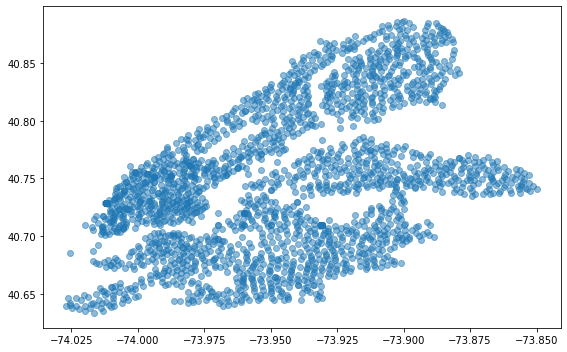

In [46]:
fig = plt.figure(figsize=(8,5))

rows, cols = 1, 1
gs = GridSpec(rows, cols)
axs = [[fig.add_subplot(gs[row, col]) for col in range(cols)] for row in range(rows)]

axs[0][0].scatter(
    df_station_total.lon, df_station_total.lat,
    alpha=0.5
)

fig.tight_layout()
fig.show()

In [47]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

X = df_station_total[["lon", "lat"]]

k_vals = [int(k) for k in np.arange(5, 100, 5)]
wcss, silhouettes = [], []
for k in k_vals:
    kmeans = KMeans(n_clusters = k, random_state = 0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(X, kmeans.labels_, metric='euclidean'))

df_kmeans = pd.DataFrame(dict(k=k_vals, wcss=wcss, silhouette=silhouettes)).set_index("k")

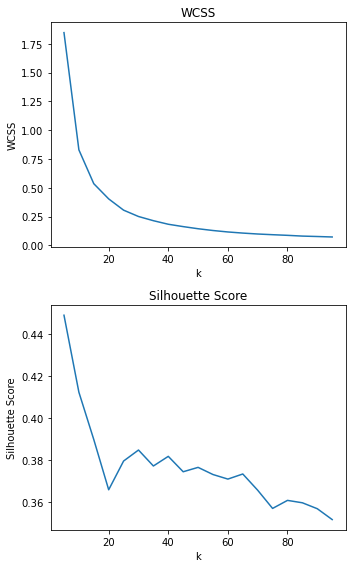

In [52]:
fig = plt.figure(figsize=(5,8))

rows, cols = 2, 1
gs = GridSpec(rows, cols)
axs = [[fig.add_subplot(gs[row, col]) for col in range(cols)] for row in range(rows)]

axs[0][0].plot(df_kmeans.index, df_kmeans.wcss)
axs[0][0].set_xlabel("k")
axs[0][0].set_ylabel("WCSS")
axs[0][0].set_title("WCSS")

axs[1][0].plot(df_kmeans.index, df_kmeans.silhouette)
axs[1][0].set_xlabel("k")
axs[1][0].set_ylabel("Silhouette Score")
axs[1][0].set_title("Silhouette Score")

fig.tight_layout()
fig.show()

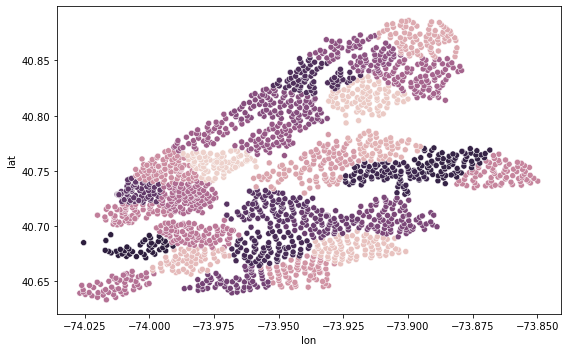

In [57]:
import seaborn as sns

fig = plt.figure(figsize=(8,5))

rows, cols = 1, 1
gs = GridSpec(rows, cols)
axs = [[fig.add_subplot(gs[row, col]) for col in range(cols)] for row in range(rows)]

kmeans = KMeans(n_clusters = 30, random_state = 0)
kmeans.fit(X)
df_station_total["neighborhood"] = kmeans.labels_

sns.scatterplot(
    data=df_station_total,
    x="lon", y="lat",
    hue="neighborhood",
    ax=axs[0][0]
)
axs[0][0].get_legend().remove()

fig.tight_layout()
fig.show()

In [58]:
df_station_total.to_csv("data/2023_station_summary.csv")

# Final Features Set
- station group
- month
- hour of day
- day of week

In [59]:
# targets
df_regression_data = df_hourly_rides_total[["station_id", "outbound_rides", "inbound_rides", "total_rides", "ride_time"]]
df_regression_data["net_rides"] = df_regression_data["inbound_rides"] - df_regression_data["outbound_rides"]
# features
df_regression_data = pd.merge(
    df_regression_data, df_station_total[["station_id", "neighborhood"]],
    left_on="station_id", right_on="station_id",
    how="inner"
)
df_regression_data["month"] = df_regression_data.ride_time.dt.month
df_regression_data["weekday"] = df_regression_data.ride_time.dt.weekday
df_regression_data["hour"] = df_regression_data.ride_time.dt.hour

df_regression_data.head()

,station_id,outbound_rides,inbound_rides,total_rides,ride_time,net_rides,neighborhood,month,weekday,hour
0,2733.03,1.0,0.0,1.0,2022-12-01 10:00:00,-1.0,13,12,3,10
1,2733.03,3.0,1.0,4.0,2022-12-01 11:00:00,-2.0,13,12,3,11
2,2733.03,1.0,1.0,2.0,2022-12-01 12:00:00,0.0,13,12,3,12
3,2733.03,1.0,2.0,3.0,2022-12-01 17:00:00,1.0,13,12,3,17
4,2733.03,1.0,0.0,1.0,2022-12-02 08:00:00,-1.0,13,12,4,8


In [60]:
df_regression_data.to_csv("2023_hourly_data_with_features.csv")

# General Visualizations

## Visualization 1: Station Map

In [306]:
df_nyc_population = pd.read_csv('data/New_York_City_Population_By_Neighborhood_Tabulation_Areas.csv')
geojson_nyc = json.load(open("data/nyc_neighborhoods.geojson"))

df_nyc_population.head()

,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
0,Bronx,2000,5,BX01,Claremont-Bathgate,28149
1,Bronx,2000,5,BX03,Eastchester-Edenwald-Baychester,35422
2,Bronx,2000,5,BX05,Bedford Park-Fordham North,55329
3,Bronx,2000,5,BX06,Belmont,25967
4,Bronx,2000,5,BX07,Bronxdale,34309


In [307]:
def calibrate_size(x, scale_factor=0.25, max_size=5):
    return (x**scale_factor / max(x**scale_factor)) * max_size

fig = go.Figure(
    go.Choroplethmapbox(
        geojson=geojson_nyc,
        locations=df_nyc_population["NTA Code"],
        featureidkey="properties.ntacode",
        z=df_nyc_population["Population"],
        colorscale="gray",
        reversescale=True,
        text=df_nyc_population["NTA Name"],
        marker=dict(opacity=0.3),
    )
)

fig.add_scattermapbox(
    lat = df_station_total["lat"],
    lon = df_station_total["lon"],
    text = df_station_total["station_name"],
    marker = dict(
        color=df_station_total['neighborhood'],
        colorscale='viridis',
        opacity = 0.3,
        size = calibrate_size(df_station_total["total_rides"], max_size=10),
    )
)


fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=10,
    mapbox_center = {"lat": df_station_total.lat.mean(), "lon": df_station_total.lon.mean(),}
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

# Visualization 2: Table with Hourly Flows

In [61]:
df_hourly_neighbhorhood_total_flows = pd.pivot_table(
    df_regression_data,
    index="neighborhood",
    columns="hour",
    values="total_rides",
    aggfunc="sum"
)

In [62]:
df_hourly_neighbhorhood_net_flows = pd.pivot_table(
    df_regression_data,
    index="neighborhood",
    columns="hour",
    values="net_rides",
    aggfunc="sum"
)

In [63]:
df_hourly_neighbhorhood_total_flows.to_csv("data/2023_neighborhood_hourly_total_flows.csv")
df_hourly_neighbhorhood_net_flows.to_csv("data/2023_neighborhood_hourly_net_flows.csv")

# Monthly Flows

In [64]:
df_monthly_neighbhorhood_total_flows = pd.pivot_table(
    df_regression_data,
    index="neighborhood",
    columns="month",
    values="total_rides",
    aggfunc="sum"
)

In [65]:
df_monthly_neighbhorhood_total_flows.to_csv("data/2023_neighborhood_monthly_total_flows.csv")

# Station-Specific Visualizations

In [3]:
df_regression_data = pd.read_csv("data/2023_hourly_data_with_features.csv")
df_regression_data["station_id"] = df_regression_data["station_id"].astype(str)

In [104]:
station_ride_counts = df_regression_data.groupby(by="station_id")[["total_rides"]].sum()\
    .sort_values(by="total_rides", ascending=False).iloc[:150]
top_stations = list(station_ride_counts.index) + ["5971.08", "4419.03", "5550.05", "4217.02", "4277.04"] # a few favorite stations
df_top_stations_flows = df_regression_data.loc[df_regression_data.station_id.isin(top_stations)]
df_top_stations_flows.to_csv("data/2023_top_stations_hourly_flows.csv")

In [86]:
df_top_stations_flows.loc[df_top_stations_flows.station_id == "4419.03"]

,station_id,outbound_rides,inbound_rides,total_rides,ride_time,net_rides,neighborhood,month,weekday,hour
1387473,4419.03,1.0,0.0,1.0,2022-12-01 00:00:00,-1.0,26,12,3,0
1387474,4419.03,1.0,0.0,1.0,2022-12-01 06:00:00,-1.0,26,12,3,6
1387475,4419.03,2.0,1.0,3.0,2022-12-01 07:00:00,-1.0,26,12,3,7
1387476,4419.03,3.0,2.0,5.0,2022-12-01 08:00:00,-1.0,26,12,3,8
1387477,4419.03,1.0,2.0,3.0,2022-12-01 09:00:00,1.0,26,12,3,9
...,...,...,...,...,...,...,...,...,...,...
1394247,4419.03,0.0,1.0,1.0,2023-11-27 22:00:00,1.0,26,11,0,22
1394248,4419.03,0.0,3.0,3.0,2023-11-28 19:00:00,3.0,26,11,1,19
1394249,4419.03,0.0,1.0,1.0,2023-11-29 11:00:00,1.0,26,11,2,11
1394250,4419.03,0.0,1.0,1.0,2023-11-30 13:00:00,1.0,26,11,3,13


In [178]:
df_station_hourly_trend = pd.pivot_table(
    df_regression_data,
    index="station_id",
    columns="hour",
    values=["total_rides", "outbound_rides", "inbound_rides", "net_rides"],
    aggfunc=["mean", "std"]
)
df_station_hourly_trend = df_station_hourly_trend.T.reset_index().rename(columns={"level_0":"estimator", "level_1":"metric"})
df_station_hourly_trend.to_csv("data/2023_station_hourly_trends.csv")
df_station_hourly_trend.head()

station_id,estimator,metric,hour,2733.03,2782.02,2821.05,2832.03,2861.02,2872.02,2883.03,...,JC115,JC116,Lab - NYC,Lab - NYC - Monolith,SYS016,SYS028,SYS032,SYS033,SYS038,SYS039
0,mean,inbound_rides,0,0.971429,0.876712,0.644444,1.000000,0.718750,0.823529,0.888889,...,NaN,1.0,NaN,NaN,0.428571,NaN,NaN,NaN,1.25,NaN
1,mean,inbound_rides,1,1.121212,1.233333,0.820513,0.959459,0.761905,0.933333,0.666667,...,NaN,0.0,NaN,NaN,0.750000,NaN,NaN,NaN,1.00,NaN
2,mean,inbound_rides,2,0.733333,1.052632,1.000000,0.923077,0.388889,0.666667,1.031250,...,NaN,NaN,NaN,NaN,0.272727,NaN,NaN,1.0,1.00,NaN
3,mean,inbound_rides,3,0.888889,0.931034,0.600000,1.046512,0.500000,1.000000,1.000000,...,NaN,NaN,NaN,NaN,0.888889,NaN,NaN,1.0,1.00,NaN
4,mean,inbound_rides,4,1.000000,0.842105,0.500000,0.375000,0.714286,0.333333,1.111111,...,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,1.0,1.00,NaN


# Model

In [4]:
import pickle
from sklearn.metrics import r2_score
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

station_ride_counts = df_regression_data.groupby(by="station_id")[["total_rides"]].sum()\
    .sort_values(by="total_rides", ascending=False)
meaningful_stations = station_ride_counts.loc[station_ride_counts.total_rides >= 10000].index
meaningful_stations = ["5971.08", "4419.03", "5550.05", "4217.02", "4277.04"] + list(meaningful_stations)

station_models = {}

for i, station in enumerate(meaningful_stations):
    try:
        X = df_regression_data.loc[df_regression_data.station_id == station][["month", "weekday", "hour"]]
        y = df_regression_data.loc[df_regression_data.station_id == station]["outbound_rides"]

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

        categorical_columns = ["month", "weekday", "hour"]
        column_trans = make_column_transformer(
            (OneHotEncoder(handle_unknown='ignore'), categorical_columns)
        )
        pipe = make_pipeline(column_trans, LinearRegression())
        pipe.fit(X_train, y_train)

        y_pred = pipe.predict(X_test)
    except:
        pipe, r_2 = None, None
    
    if i % 50 == 0:
        print(f"{(i+1)/len(meaningful_stations):,.0%} complete")

    station_models[station] = dict(
        model=pipe,
        r_2=r2_score(y_test, y_pred)
    )

filehandler = open("models/models_dict.pkl", "wb")
pickle.dump(station_models, filehandler)

0% complete
4% complete
8% complete
12% complete
16% complete
20% complete
23% complete
27% complete
31% complete
35% complete
39% complete
43% complete
47% complete
51% complete
55% complete
59% complete
62% complete
66% complete
70% complete
74% complete
78% complete
82% complete
86% complete
90% complete
94% complete
98% complete


In [166]:
filehandler = open("models/models_dict.pkl",'rb')
station_models_dict = pickle.load(filehandler)

station_id  = "4419.03"

model = station_models_dict[station_id]["model"]
r_2 = station_models_dict[station_id]["r_2"]

In [167]:
import datetime
from pytz import timezone

tz = timezone('US/Eastern')
now = datetime.datetime.now(tz) 

df_curr_data = pd.DataFrame(dict(
    month=[now.month], weekday=[now.month], hour=[now.hour], 
))

model.predict(df_curr_data)

array([2.16838724])

(array([ 1.,  0.,  2.,  1.,  3.,  8., 17., 11.,  6.,  1.]),
 array([0.20961295, 0.25831032, 0.30700769, 0.35570506, 0.40440243,
        0.4530998 , 0.50179717, 0.55049454, 0.59919192, 0.64788929,
        0.69658666]),
 <BarContainer object of 10 artists>)

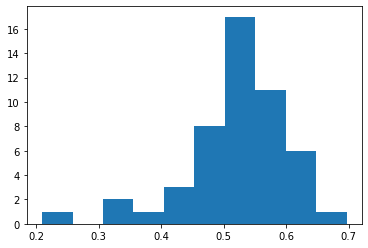

In [175]:
import matplotlib.pyplot as plt

df_r_2s = pd.DataFrame(np.array([[k, v["r_2"]] for k, v in station_models_dict.items()]))
df_r_2s.columns = ["station_id", "r_2"]
df_r_2s["r_2"] = df_r_2s["r_2"].astype(float)

plt.hist(df_r_2s.r_2)